In [646]:
pwd

'/Users/ud4/repos/GitHub/FATESFACE'

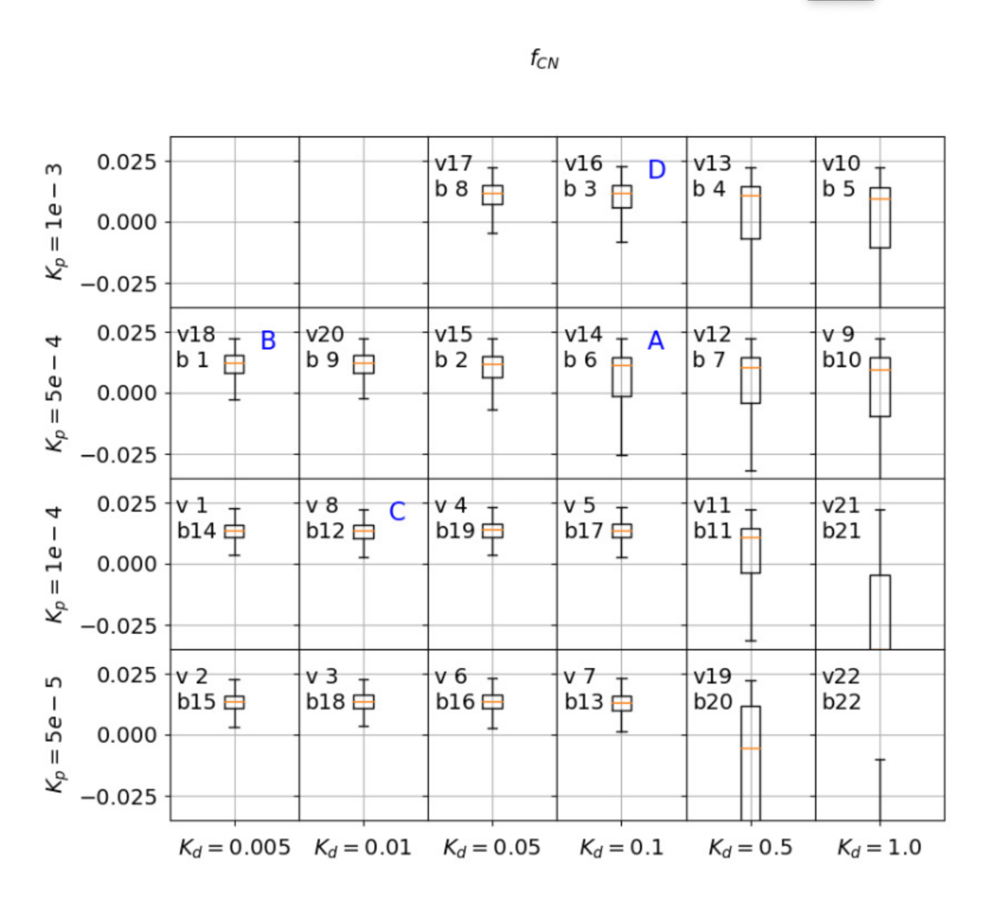

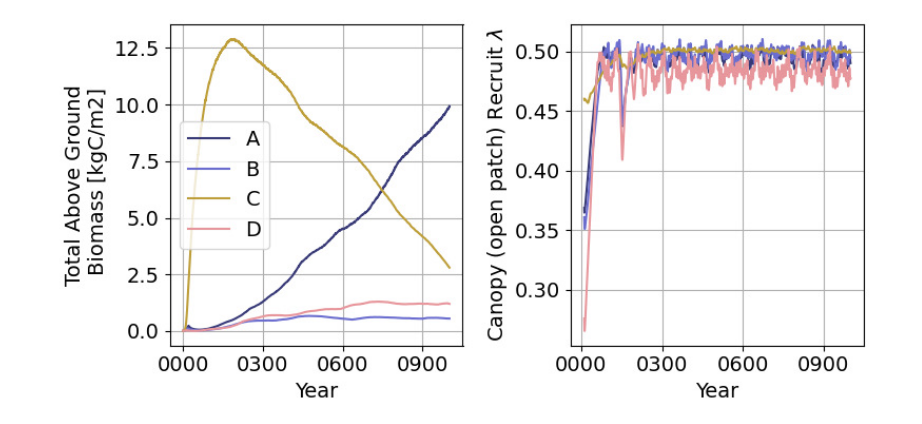

Source : Knox 2023 (under review; https://d197for5662m48.cloudfront.net/documents/publicationstatus/129549/preprint_pdf/4892791c8be5504aff47afd6065937b7.pdf)


In [647]:
from IPython.display import Image, display
display(Image(filename='/Users/ud4/Downloads/PIDs.png',width=800))
display(Image(filename='/Users/ud4/Downloads/BiomassVsPIDs.png',width=800))
print ("Source : Knox 2023 (under review; https://d197for5662m48.cloudfront.net/documents/publicationstatus/129549/preprint_pdf/4892791c8be5504aff47afd6065937b7.pdf)")

# New Cases

PID | Kp | Kd
---|---|---
A|0.0005|0.1
B|0.0005|0.005
C|0.0001|0.01
D|0.001|0.1
E|0.001|0.5
F|0.005|0.1
G|0.005|0.5
H|0.001|1.0

## Index

## Added features
- for a cell, you can choose which variables you are interested in for a single simulation.
- some plots from postprocessor

In [648]:
import os,glob
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyreadr # to read .rds files
import datetime as dt

np.set_printoptions(suppress=True)

In [649]:
path_in = "/Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/230309/"


In [650]:
# RD only

fnames={}
fnames["DUK_PIDA_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDA_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDB_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDB_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDC_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDC_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDD_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDD_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_US-ORN_trans.nc"


fnames["DUK_PIDA_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDA_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_RD_US-ORN_trans.nc"

fnames["DUK_PIDB_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDB_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_RD_US-ORN_trans.nc"

#"ORN_PIDC_RD" : Simulation missing *Running
fnames["DUK_PIDC_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDC_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_US-DUK_trans.nc"

fnames["DUK_PIDD_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDD_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_RD_US-ORN_trans.nc"

fnames["DUK_PIDE_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDE_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDE_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDE_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDE_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDE_AgBgW_RD_US-ORN_trans.nc"

fnames["DUK_PIDF_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDF_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_RD_US-ORN_trans.nc"

fnames["DUK_PIDG_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDG_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_RD_US-ORN_trans.nc"

fnames["DUK_PIDH_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDH_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_RD_US-ORN_trans.nc"

# BgW only

fnames["DUK_PIDE_Conly_BgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_BgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_US-ORN_trans.nc"

fnames["DUK_PIDE_RD_BgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDE_RD_BgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_RD_US-ORN_trans.nc"

# RootW only

fnames["DUK_PIDE_Conly_RootW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_RootW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_US-ORN_trans.nc"

fnames["DUK_PIDE_RD_RootW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_RD_US-DUK_trans.nc"
fnames["ORN_PIDE_RD_RootW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_RD_US-ORN_trans.nc"

# default is CN 53
fnames["DUK_PIDE_Conly_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_US-ORN_trans.nc"

fnames["DUK_PIDE_RD_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_RD_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_RD_US-DUK_trans.nc"
#fnames["ORN_PIDE_RD_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_RD_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_RD_US-ORN_trans.nc"

fnames["DUK_PIDE_Conly_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_US-ORN_trans.nc"

fnames["DUK_PIDE_RD_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_RD_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_RD_US-DUK_trans.nc"
fnames["ORN_PIDE_RD_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_RD_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_RD_US-ORN_trans.nc"

#fnames["DUK_PIDzero_RD"] = : Simulation missing *Running
#fnames["ORN_PIDzero_RD"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r06122_Base_PIDzero_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r06122_Base_PIDzero_RD_US-ORN_trans.nc"





In [651]:
# Other global attributes for plots

logging_year= 1855

In [652]:
ds = {}

In [653]:
for idx, key in enumerate(fnames.keys()):
    print (key)
    ds[key] = xr.open_mfdataset(fnames[key],decode_times=True)
for idx, key in enumerate(ds.keys()):
    ds[key]['time'] =  pd.to_datetime(ds[key].time.values.astype(str))

DUK_PIDA_Conly_AgBgW
ORN_PIDA_Conly_AgBgW
DUK_PIDB_Conly
ORN_PIDB_Conly
DUK_PIDC_Conly
ORN_PIDC_Conly
DUK_PIDD_Conly
ORN_PIDD_Conly
DUK_PIDA_RD_AgBgW
ORN_PIDA_RD_AgBgW
DUK_PIDB_RD_AgBgW
ORN_PIDB_RD_AgBgW
DUK_PIDC_RD_AgBgW
ORN_PIDC_RD_AgBgW
DUK_PIDD_RD_AgBgW
ORN_PIDD_RD_AgBgW
DUK_PIDE_RD_AgBgW
ORN_PIDE_RD_AgBgW
DUK_PIDF_RD_AgBgW
ORN_PIDF_RD_AgBgW
DUK_PIDG_RD_AgBgW
ORN_PIDG_RD_AgBgW
DUK_PIDH_RD_AgBgW
ORN_PIDH_RD_AgBgW
DUK_PIDE_Conly_BgW
ORN_PIDE_Conly_BgW
DUK_PIDE_RD_BgW
ORN_PIDE_RD_BgW
DUK_PIDE_Conly_RootW
ORN_PIDE_Conly_RootW
DUK_PIDE_RD_RootW
ORN_PIDE_RD_RootW
DUK_PIDE_Conly_AgBgW_CN55
ORN_PIDE_Conly_AgBgW_CN55
DUK_PIDE_Conly_AgBgW_CN35
ORN_PIDE_Conly_AgBgW_CN35
DUK_PIDE_RD_AgBgW_CN55
DUK_PIDE_RD_AgBgW_CN35
ORN_PIDE_RD_AgBgW_CN35


## Name of the single simulation that you want to investigate: 

AW: PID-D for both Duke and ORNL, and PID-B for Duke.

In [720]:
sims = "ORN_PIDB_RD_AgBgW"
sims = "DUK_PIDB_RD_AgBgW"
sims = "DUK_PIDD_RD_AgBgW"
sims = "ORN_PIDD_RD_AgBgW"
sims = "DUK_PIDE_RD_AgBgW"
sims = "ORN_PIDE_RD_AgBgW"
#sims = "DUK_PIDF_RD_AgBgW"
#sims = "ORN_PIDF_RD_AgBgW"
#sims = "DUK_PIDG_RD_AgBgW"
#sims = "ORN_PIDH_RD_AgBgW"
#sims = "DUK_PIDH_RD_AgBgW"

sims = "DUK_PIDE_Conly_BgW"
sims = "ORN_PIDE_Conly_BgW"

sims = "DUK_PIDE_RD_BgW"
#sims = "ORN_PIDE_RD_BgW"

#sims = "DUK_PIDE_Conly_RootW"
#sims = "ORN_PIDE_Conly_RootW"

#sims = "DUK_PIDE_RD_RootW"
#sims = "ORN_PIDE_RD_RootW" 

#sims = "DUK_PIDE_RD_AgBgW_CN55"
#sims = "ORN_PIDE_RD_AgBgW_CN55" # Not available

#sims = "DUK_PIDE_RD_AgBgW_CN35"
#sims = "ORN_PIDE_RD_AgBgW_CN35"



In [752]:
idx_logging_date = 4*365+1 # Jan 1, 1855

# For multiple variables on a same plot upto 5 years after logging 
Yrs_Next = 5 # upto 5 years after logging 


All Plots >>>>>>
DUK_PIDE_RD_BgW


/Users/ud4/opt/anaconda3/envs/pyces/lib/python3.9/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


DUK_PIDE_RD_BgW


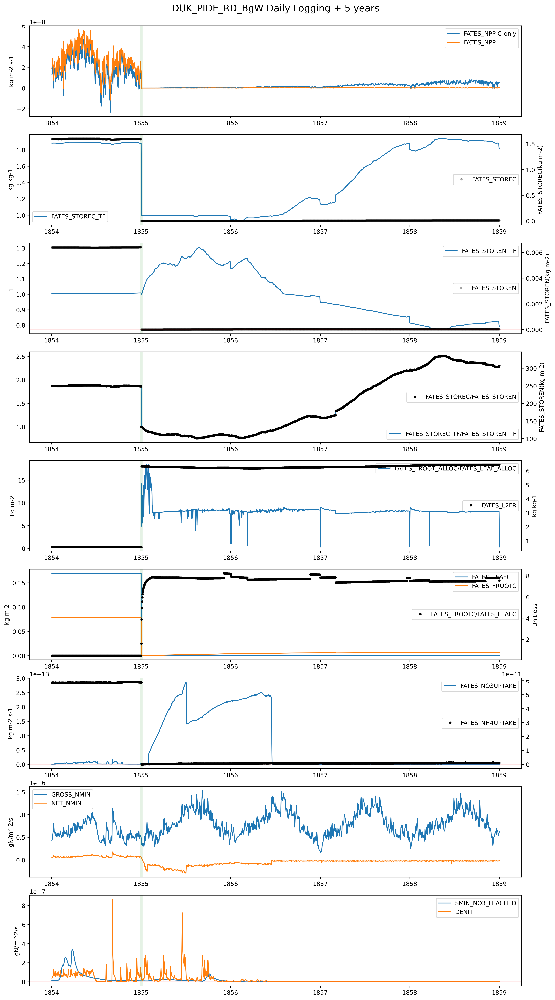

In [753]:
print ("\nAll Plots >>>>>>")

fig, axs = plt.subplots(9,1 , figsize=(15,30), dpi=400)

# Subplot 1 >>>
idx_ax = 0
var = "FATES_NPP"
# C-only
sim_conly = sims.replace("RD", "Conly")
key=sim_conly
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var + " C-only")
# RD
key=sims
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var )
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key} Daily Logging + 5 years\n",fontsize=16)
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)

print(key)
# Subplot 1 <<<

# Subplot 2 >>>
idx_ax = 1
vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'k.',  label = var, alpha=.3)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 2 <<<

# Subplot 3 >>>
idx_ax = 2
vars_plot = (
"""
FATES_STOREN_TF
FATES_STOREN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'k.',  label = var, alpha=.3)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.legend(loc = 5)
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)

# Subplot 3 <<<
# Subplot 4 >>>
idx_ax = 3
ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time, ts_data, 'k.', label = "FATES_STOREC/FATES_STOREN")
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
# Subplot 4 <<<


# Subplot 5 >>>
idx_ax = 4
ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = ds[key]["FATES_L2FR"][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time, ts_data, 'k.', label = "FATES_L2FR")
ax_tmp.set_ylabel (f"{ds[key]['FATES_L2FR'].units}")
ax_tmp.legend(loc = 5)
# Subplot 5 <<<

# Subplot 6 >>>
idx_ax = 5
vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time, ts_data, 'k.', label = "FATES_FROOTC/FATES_LEAFC")
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"Unitless")

# Subplot 6 <<<

# Subplot 7 >>>
idx_ax = 6
vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'k.',  label = var)
ax_tmp.legend(loc = 5)
# Subplot 7 <<<

# Subplot 8 >>>
idx_ax = 7
vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 8 <<<

# Subplot 9 >>>
idx_ax = 8
vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 9 <<<
print(key)
for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = dt.date(1855,1,1), color = 'g',lw=5, alpha=.1)
fig.savefig('./Plots/' + f'{key}_daily.pdf',bbox_inches='tight')
fig.savefig('./Plots/' + f'{key}_daily.png',bbox_inches='tight')


## Working on the PID Variables
- Kp, Kd, Ki : inputs
Calculate:
- fcn = SafeLog(MAXnp((C/C')/(M/M'))
- integrate:
- derivative:
- multiples

Hint:

'''
       
       cx_int = cx_int + cx_logratio

       ! Reset the integrator if its sign changes
       if( abs(cx_logratio)>nearzero .and. abs(cx0)>nearzero) then
          if( abs(cx_logratio/abs(cx_logratio) - cx0/abs(cx0)) > nearzero ) then
             cx_int = cx_logratio
          end if
       end if

       dcxdt_ratio = cx_logratio-cx0

       ema_dcxdt = pid_drv_wgt*dcxdt_ratio + (1._r8-pid_drv_wgt)*ema_dcxdt

       cx0 = cx_logratio
'''

In [722]:
# PID Params

#E|0.001|0.5

if sims.split('_')[1] == 'PIDE':
    pid_kp = 0.001
    pid_kd = 0.5
    pid_ki = 0.0
if sims.split('_')[1] == 'PIDH':
    pid_kp = 0.001
    pid_kd = 1.0
    pid_ki = 0.0
l2fr_min = 0.01 #  frim PRTGeneric Mod

In [723]:
def SafeLog(val):
    # As defined in PRTAllometricCNPMod
    safelog_min = 0.001
    safelog_max = 1000
    clipped_val = np.clip(val, safelog_min, safelog_max)
    logval = np.log(clipped_val)
    return logval

In [724]:
cn_ratio = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"])[idx_logging_date:idx_logging_date+Yrs_Next*365] 
cp_ratio = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREP_TF"])[idx_logging_date:idx_logging_date+Yrs_Next*365] 

#keeping priority if CN Ratio only
cx_logratio_ar = SafeLog(cn_ratio) # fcn
cx_logratio_ar = np.ravel(cx_logratio_ar)
#cx_logratio_ar = np.insert(cx_logratio_ar, 0, 0) # adding first value as 0

#derivative
dcxdt_ratio_mat =  cx_logratio_ar[1:] - cx_logratio_ar[:-1]

In [725]:
ts_data_l2fr = ds[key]['FATES_L2FR'][idx_logging_date:idx_logging_date+Yrs_Next*365]
ts = ts_data_l2fr.values
delta_l2fr_model = ts[1:] - ts[:-1]


In [726]:
delta_l2fr_model[:,0][0]
ema_dcxdt_init = (delta_l2fr_model[:,0][0] - pid_kp*dcxdt_ratio_mat[0])/pid_kd
ema_dcxdt_init

-1.597529649734497e-05

In [727]:
#integration
pid_drv_wgt = 1/20.   # n-day smoothing of the derivative of the process function in the PID controller
cx_int = cx_logratio_ar[0]#0
cx0 = cx_logratio_ar[0]#0.
ema_dcxdt = ema_dcxdt_init #cx_logratio_ar[0]*(pid_drv_wgt)#0. 
#cx_logratio_ar = cx_logratio_ar[1:] # removing the zero that we added earlier
nearzero = 1e-30
cx_int_ar = []
dcxdt_ratio_ar = []
ema_dcxdt_ar = []
for idx, cx_logratio in enumerate (cx_logratio_ar[1:]):
    cx_int = cx_int + cx_logratio
    #Reset the integrator if its sign changes
    if abs(cx_logratio)> nearzero and abs(cx0)> nearzero :
        if abs(cx_logratio/abs(cx_logratio) - cx0/abs(cx0)) > nearzero :
             cx_int = cx_logratio
    dcxdt_ratio = cx_logratio-cx0         
    ema_dcxdt = pid_drv_wgt*dcxdt_ratio + (1.-pid_drv_wgt)*ema_dcxdt
    cx0 = cx_logratio
    if idx == 1: print (dcxdt_ratio,ema_dcxdt)
    cx_int_ar.append(cx_int)
    dcxdt_ratio_ar.append(dcxdt_ratio)
    ema_dcxdt_ar.append(ema_dcxdt)
cx_int_ar = np.array(cx_int_ar)
dcxdt_ratio_ar = np.array(dcxdt_ratio_ar)
ema_dcxdt_ar = np.array(ema_dcxdt_ar)

# Repeating the first value twice in the begining
cx_int_ar = np.insert(cx_int_ar,0,cx_int_ar[0])
dcxdt_ratio_ar = np.insert(dcxdt_ratio_ar,0,dcxdt_ratio_ar[0])
ema_dcxdt_ar = np.insert(ema_dcxdt_ar,0,ema_dcxdt_ar[0])

-0.00062942505 -6.284655347466469e-05


In [728]:
# Sanity check
sum(dcxdt_ratio_ar[1:] == dcxdt_ratio_mat)

1824

In [729]:
l2fr_delta_ar = []

for idx in range(len(cx_logratio_ar[1:])):
    cx_logratio = cx_logratio_ar[idx]
    cx_int = cx_int_ar[idx]
    ema_dcxdt = ema_dcxdt_ar [idx]
    l2fr_delta = pid_kp*cx_logratio + pid_ki*cx_int + pid_kd*ema_dcxdt
    l2fr_delta_ar.append(l2fr_delta)
l2fr_delta_ar = np.array(l2fr_delta_ar)    

# Repeating the first value twice in the begining
l2fr_delta_ar = np.insert(l2fr_delta_ar,0,l2fr_delta_ar[0])

In [730]:
# Taking the first value from the variable L2FR
ts_data_l2fr = ds[key]['FATES_L2FR'][idx_logging_date:idx_logging_date+Yrs_Next*365]
ts = np.ravel(ts_data_l2fr.values)

l2fr = ts[0]
L2FR_ar_vals = np.zeros(l2fr_delta_ar.shape, dtype=np.float64)

#L2FR_ar = []
for i in range(len(l2fr_delta_ar)):
    l2fr_delta = l2fr_delta_ar[i]
    l2fr = max(l2fr_min, l2fr + l2fr_delta)
    L2FR_ar_vals[i] = l2fr
#L2FR_ar = l2fr_delta_ar.cumsum()

In [731]:
L2FR_ar_vals

array([0.55289041, 0.55330953, 0.5537283 , ..., 2.8634028 , 2.86702203,
       2.87065679])

In [732]:
L2FR_ar

array([0.00041913, 0.00083825, 0.00125702, ..., 2.31093152, 2.31455075,
       2.31818551])

In [733]:
ts[0]

0.5524713

## Plots
The variables that are calcuated based on the C/C' and N/N'
- cx_logratio_ar : CN ratio
- ema_dcxdt_ar   : Smoothened derivative term PID
- cx_int_ar      : Integral term PID
- l2fr_delta_ar  : Delta l2fr 

Other variables are directly ploted from model variables (except l2fr_delta_model, which is just the difference of FATES_L2FR one month apart

In [734]:
fig, axs = plt.subplots(10,1 , figsize=(15,40), dpi=400)


idx_ax = 0
#FATES_LEAFC
vars_plot = (
"""
FATES_LEAFC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key} Daily Logging + 5 years (PID control parameters) \n",fontsize=16)
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
#ax_tmp = axs[idx_ax].twinx()
#ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
#ax_tmp.plot(ts_data.time, ts_data, 'k+', label = "FATES_FROOTC/FATES_LEAFC", markersize = 4, alpha =.1)
#ax_tmp.legend(loc = 5)
#ax_tmp.set_ylabel (f"Unitless")


# Subplot >>>
idx_ax = 1 + idx_ax
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREC_TF"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = "FATES_STOREC_TARGET", alpha=.3)
axs[idx_ax].set_ylabel (f"{ds[key]['FATES_STOREC'].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREN"]/ds[key]["FATES_STOREN_TF"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'r+',  label = "FATES_STOREN_TARGET", alpha=.1, markersize = 6)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{'FATES_STOREN'}({ds[key]['FATES_STOREN'].units})")
ax_tmp.axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot 2 <<<

# Subplot >>>
idx_ax = 1 + idx_ax
ts_data = (ds[key]["FATES_STOREC_TF"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = "FATES_STOREC_TF", alpha=.3)
axs[idx_ax].set_ylabel (f"{ds[key]['FATES_STOREC_TF'].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREN_TF"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'r+',  label = "FATES_STOREN_TF", alpha=.1, markersize = 6)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{'FATES_STOREN_TF'}({ds[key]['FATES_STOREN_TF'].units})")
ax_tmp.axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<


# Subplot >>>
idx_ax = 1 + idx_ax
key=sims
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, cx_logratio_ar, label = "SafeLog(FATES Store TF C:N* or $F_{CN}$*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<


# Subplot >>>
idx_ax = 1 + idx_ax
axs[idx_ax].plot(ts_data.time, ema_dcxdt_ar, label = "Smoothened Derivative of Log(C:N) or $dF_{CN}$*" )
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
#ax_tmp = axs[idx_ax].twinx()
#ax_tmp.plot(ts_data.time, pid_kd * ema_dcxdt_ar, 'r+', label = "pid_kd * ema_dcxdt_ar", markersize = 4, alpha =.1 )
#ax_tmp.legend(loc = 5)
# Subplot  <<<

# Subplot >>>
idx_ax = 1 + idx_ax
axs[idx_ax].plot(ts_data.time, cx_int_ar, label = "Integral of Log(C:N)* or $\int$$F_{CN}$*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<

# Subplot >>>
idx_ax = 1 + idx_ax
KpxFcn = pid_kp * cx_logratio_ar    
KdxDerivative = pid_kd * ema_dcxdt_ar    
KixIntegral = pid_ki * cx_int_ar    
print (f"pid_kp : {pid_kp}\n pid_kd : {pid_kd}\n pid_ki : {pid_ki} ")
axs[idx_ax].plot(ts_data.time, KpxFcn, label = r"Kp$\times$ $F_{CN}$*" )
axs[idx_ax].plot(ts_data.time, KdxDerivative, label = r"Kd $\times$ $dF_{CN}$*" )
axs[idx_ax].plot(ts_data.time, KixIntegral, label = r"Ki $\times$ $\int$$F_{CN}$*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<

# Subplot >>>
idx_ax = 1 + idx_ax
KpxFcn_prop = np.abs(pid_kp * cx_logratio_ar)/np.sum(np.abs((KpxFcn,KdxDerivative,KixIntegral)),axis=0)
KdxDerivative_prop = pid_kd * ema_dcxdt_ar/np.sum(np.abs((KpxFcn,KdxDerivative,KixIntegral)),axis=0)
KixIntegral_prop = pid_ki * cx_int_ar/np.sum(np.abs((KpxFcn,KdxDerivative,KixIntegral)),axis=0)
print (f"pid_kp : {pid_kp}\n pid_kd : {pid_kd}\n pid_ki : {pid_ki} ")
axs[idx_ax].plot(ts_data.time, KpxFcn_prop, label = r"(Kp $\times$ $F_{CN}$)/$\Sigma$|Kp$\times$ $F_{CN}$ + Kd $\times$ $dF_{CN}$ + Ki $\times$ $\int$$F_{CN}$|*" )
axs[idx_ax].plot(ts_data.time, KdxDerivative_prop, label = r"(Kd $\times$ $dF_{CN}$/$\Sigma$|Kp$\times$ $F_{CN}$ + Kd $\times$ $dF_{CN}$ + Ki $\times$ $\int$$F_{CN}$|*" )
axs[idx_ax].plot(ts_data.time, KixIntegral_prop, label = r"(Ki $\times$ $\int$$F_{CN}$/$\Sigma$|Kp$\times$ $F_{CN}$ + Kd $\times$ $dF_{CN}$ + Ki $\times$ $\int$$F_{CN}$|*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<

# Subplot >>>
idx_ax = 1 + idx_ax
axs[idx_ax].plot(ts_data.time, l2fr_delta_ar, label = r"$\Delta$ L2FR*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
ax_tmp = axs[idx_ax].twinx()
ts_data_l2fr = ds[key]['FATES_L2FR'][idx_logging_date:idx_logging_date+Yrs_Next*365]
ts = ts_data_l2fr.values
delta_l2fr_model = ts[1:] - ts[:-1]
ax_tmp.plot(ts_data_l2fr.time[:-1], delta_l2fr_model,'r+', label = "$\Delta$ FATES_L2FR", alpha=.1, markersize = 6)
ax_tmp.legend(loc = 5)
# Subplot  <<<


# Subplot >>>
idx_ax = 1 + idx_ax
#L2FR_ar = l2fr_delta_ar.cumsum()
axs[idx_ax].plot(ts_data.time, L2FR_ar_vals, label = "L2FR*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
ax_tmp = axs[idx_ax].twinx()
ts_data_l2fr = ds[key]['FATES_L2FR'][idx_logging_date:idx_logging_date+Yrs_Next*365]
axs[idx_ax].plot(ts_data_l2fr.time, ts_data_l2fr,'r+', label = "FATES_L2FR", alpha=.1, markersize = 6)




for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = dt.date(1855,1,1), color = 'g',lw=5, alpha=.1)

fig.savefig('./Plots/' + f'{key}_daily_calc.pdf',bbox_inches='tight')
fig.savefig('./Plots/' + f'{key}_daily_calc.png',bbox_inches='tight')

pid_kp : 0.001
 pid_kd : 0.5
 pid_ki : 0.0 
pid_kp : 0.001
 pid_kd : 0.5
 pid_ki : 0.0 



All Plots >>>>>>
DUK_PIDE_RD_BgW


/Users/ud4/opt/anaconda3/envs/pyces/lib/python3.9/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


DUK_PIDE_RD_BgW


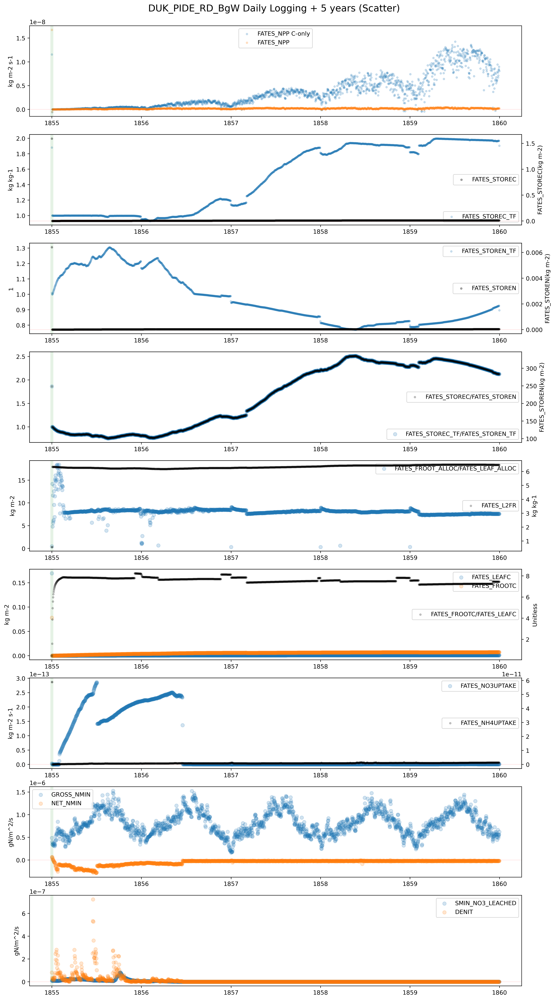

In [735]:
print ("\nAll Plots >>>>>>")

idx_logging_date = 5*365 # Jan 1, 1855

# For multiple variables on a same plot upto 5 years after logging 
Yrs_Next = 5 # upto 5 years after logging 

fig, axs = plt.subplots(9,1 , figsize=(15,30), dpi=400)

# Subplot 1 >>>
idx_ax = 0
var = "FATES_NPP"
# C-only
sim_conly = sims.replace("RD", "Conly")
key=sim_conly
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, marker=".", label = var + " C-only",alpha=.2)
# RD
key=sims
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, marker=".", label = var ,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key} Daily Logging + 5 years (Scatter) \n",fontsize=16)
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)

print(key)
# Subplot 1 <<<

# Subplot 2 >>>
idx_ax = 1
vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, marker=".", label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time,ts_data,marker=".", color='k', label = var, alpha=.3)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 2 <<<

# Subplot 3 >>>
idx_ax = 2
vars_plot = (
"""
FATES_STOREN_TF
FATES_STOREN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, marker=".", label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time,ts_data, marker=".", color='k',label = var, alpha=.3)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.legend(loc = 5)
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)

# Subplot 3 <<<
# Subplot 4 >>>
idx_ax = 3
ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF",alpha=.2)
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time, ts_data,  marker=".", color='k', label = "FATES_STOREC/FATES_STOREN",alpha=.2)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
# Subplot 4 <<<


# Subplot 5 >>>
idx_ax = 4
ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC",alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = ds[key]["FATES_L2FR"][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time, ts_data,  marker=".", color='k', label = "FATES_L2FR",alpha=.2)
ax_tmp.set_ylabel (f"{ds[key]['FATES_L2FR'].units}")
ax_tmp.legend(loc = 5)
# Subplot 5 <<<

# Subplot 6 >>>
idx_ax = 5
vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].scatter(ts_data.time, ts_data, label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"])[idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time, ts_data,  marker=".", color='k', label = "FATES_FROOTC/FATES_LEAFC",alpha=.2)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"Unitless")

# Subplot 6 <<<

# Subplot 7 >>>
idx_ax = 6
vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time,ts_data, marker=".", color='k',  label = var,alpha=.2)
ax_tmp.legend(loc = 5)
# Subplot 7 <<<

# Subplot 8 >>>
idx_ax = 7
vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].scatter(ts_data.time, ts_data, label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 8 <<<

# Subplot 9 >>>
idx_ax = 8
vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_logging_date:idx_logging_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].scatter(ts_data.time, ts_data, label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 9 <<<
print(key)
for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = dt.date(1855,1,1), color = 'g',lw=5, alpha=.1)
#fig.savefig('./Plots/' + f'{key}_Scatter_daily.pdf',bbox_inches='tight')
#fig.savefig('./Plots/' + f'{key}_Scatter_daily.png',bbox_inches='tight')



All Plots >>>>>>


/Users/ud4/opt/anaconda3/envs/pyces/lib/python3.9/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


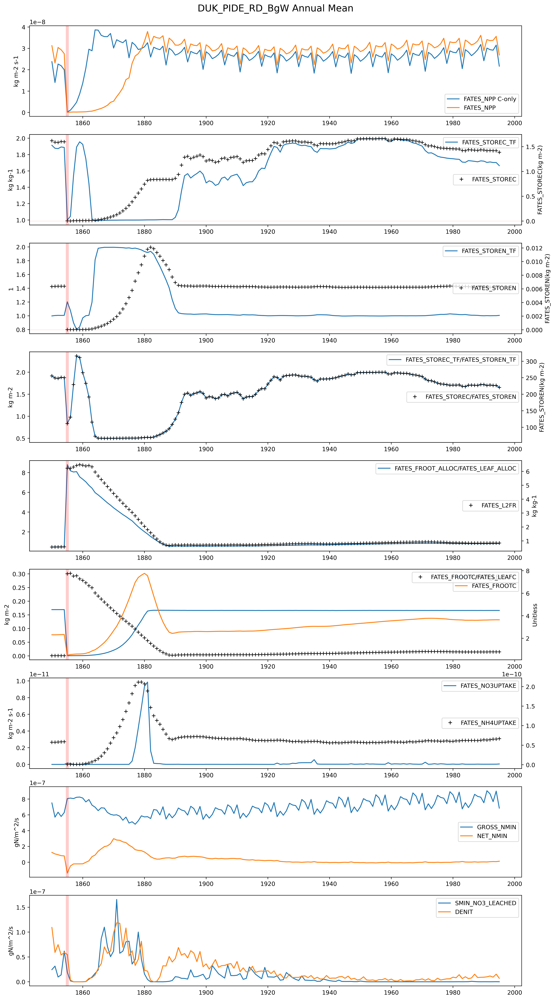

In [736]:
print ("\nAll Plots >>>>>>")
# For multiple variables on a same plot
fig, axs = plt.subplots(9,1 , figsize=(15,30), dpi=400)

# Subplot 1 >>>
idx_ax = 0
var = "FATES_NPP"
# C-only
sim_conly = sims.replace("RD", "Conly")
key=sim_conly
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var + " C-only")
# RD
key=sims
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var )
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key} Annual Mean\n",fontsize=16)

# Subplot 1 <<<

# Subplot 2 >>>
idx_ax = 1
vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 2 <<<

# Subplot 3 >>>
idx_ax = 2
vars_plot = (
"""
FATES_STOREN_TF
FATES_STOREN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.legend(loc = 5)
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)

# Subplot 3 <<<

# Subplot 4 >>>
idx_ax = 3
ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"]).groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF")
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"]).groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data, 'k+', label = "FATES_STOREC/FATES_STOREN")
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
# Subplot 4 <<<

# Subplot 5 >>>
idx_ax = 4
ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"]).groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
#axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = ds[key]["FATES_L2FR"].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data,'k+', label = "FATES_L2FR")
ax_tmp.set_ylabel (f"{ds[key]['FATES_L2FR'].units}")
ax_tmp.legend(loc = 5)
# Subplot 5 <<<

# Subplot 6 >>>
idx_ax = 5
vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"]).groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data, 'k+', label = "FATES_FROOTC/FATES_LEAFC")
ax_tmp.legend(loc = 1)
ax_tmp.set_ylabel (f"Unitless")

# Subplot 6 <<<

# Subplot 7 >>>
idx_ax = 6
vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.legend(loc = 5)
# Subplot 7 <<<

# Subplot 8 >>>
idx_ax = 7
vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 8 <<<

# Subplot 9 >>>
idx_ax = 8
vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 9 <<<


for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = logging_year, color = 'r',lw=5, alpha=.2)
    
fig.savefig('./Plots/' + f'{key}.pdf',bbox_inches='tight')
fig.savefig('./Plots/' + f'{key}.png',bbox_inches='tight')


In [737]:
#print(breakit)

## The next cell is for the carbon only simuations for the chosen site

### *Figure Set 1*


Figure Set 1 >>>>>>


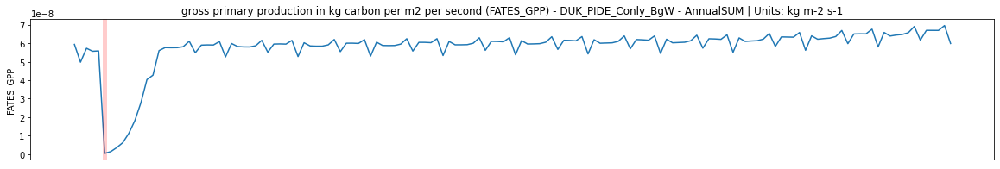

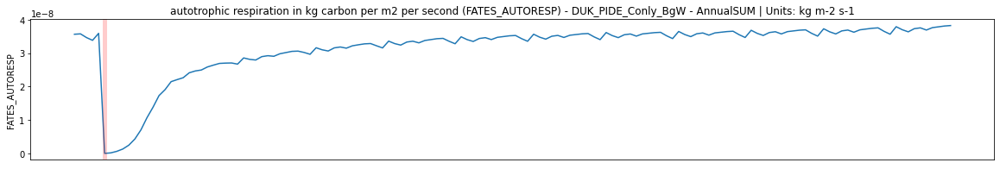

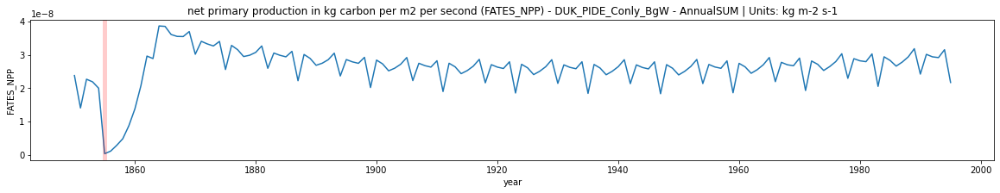

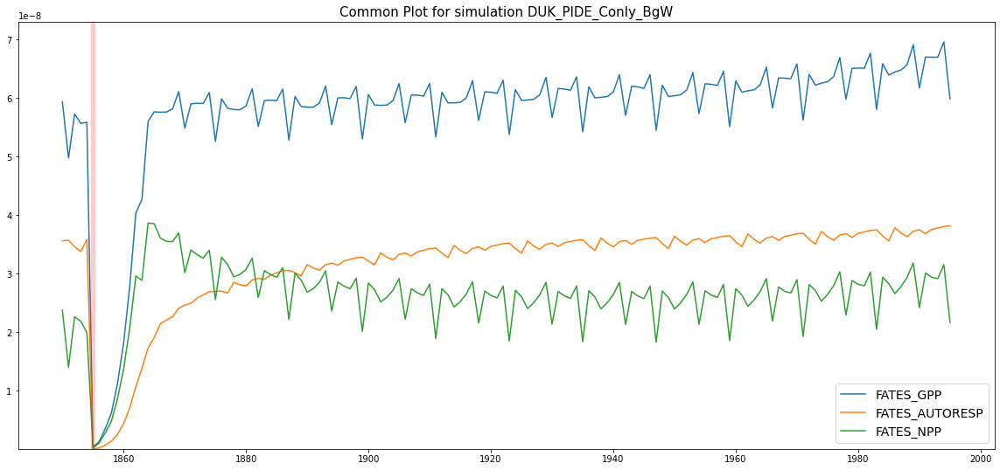

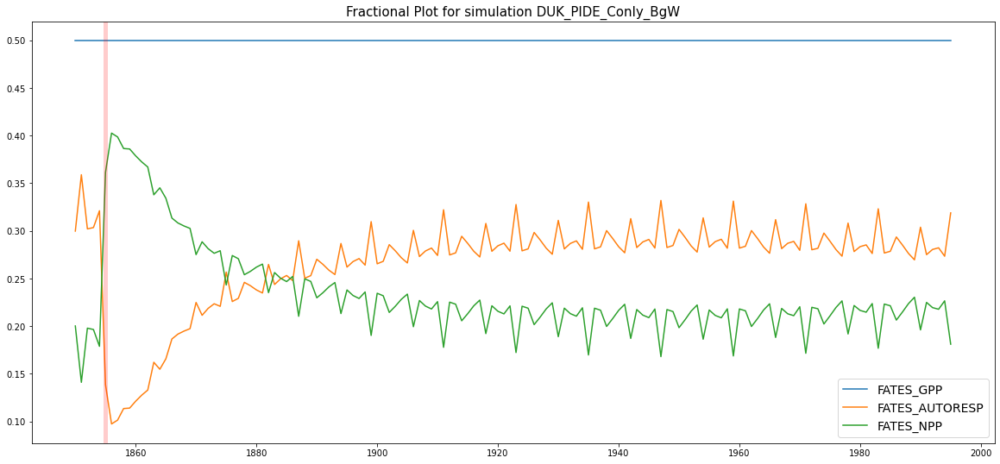

In [738]:
print ("\nFigure Set 1 >>>>>>")
# For multiple variables on a same plot

sim_conly = sims.replace("RD", "Conly")

key=sim_conly
#key=sims
vars_plot = (
"""
FATES_GPP
FATES_AUTORESP
FATES_NPP
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
#plt.close(fig)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
#plt.close(fig1)
#plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)


In [739]:
ts_data.year

<xarray.DataArray 'year' (year: 146)>
array([1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861,
       1862, 1863, 1864, 1865, 1866, 1867, 1868, 1869, 1870, 1871, 1872, 1873,
       1874, 1875, 1876, 1877, 1878, 1879, 1880, 1881, 1882, 1883, 1884, 1885,
       1886, 1887, 1888, 1889, 1890, 1891, 1892, 1893, 1894, 1895, 1896, 1897,
       1898, 1899, 1900, 1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909,
       1910, 1911, 1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921,
       1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933,
       1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945,
       1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957,
       1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969,
       1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981,
       1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993,
       1994, 1995])
Coordinates:
  * year     (year) int64 1850 1851 1852 1853 1854 ... 1991 1992 1993 1994 1995

## Rest of the results are for the chosen sim!

### *Figure Set 2*


Figure Set 2 >>>>>>


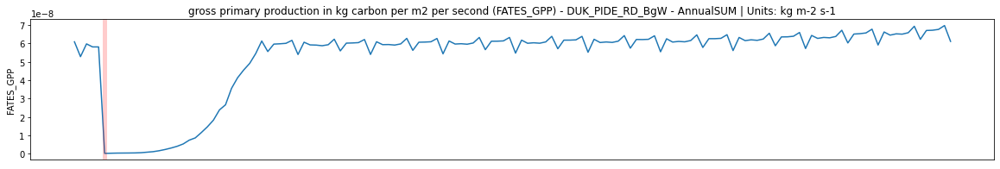

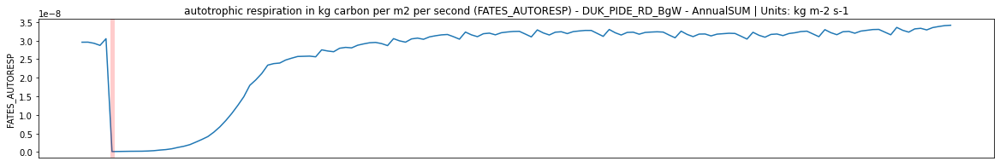

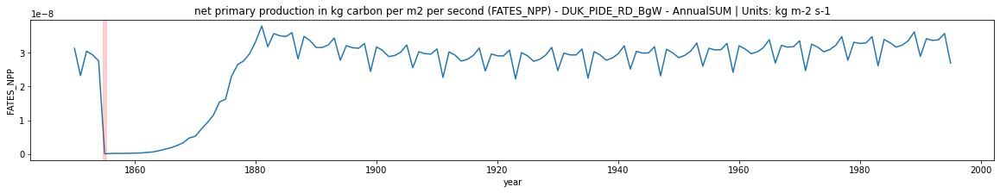

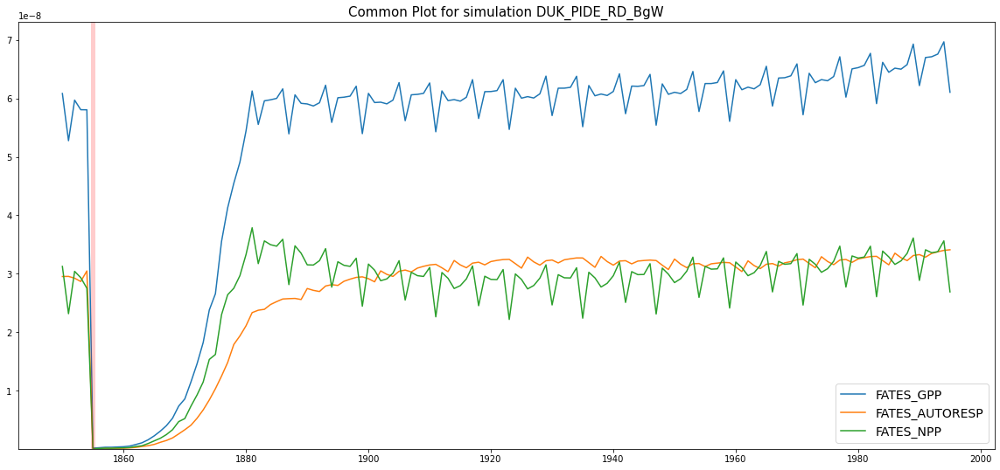

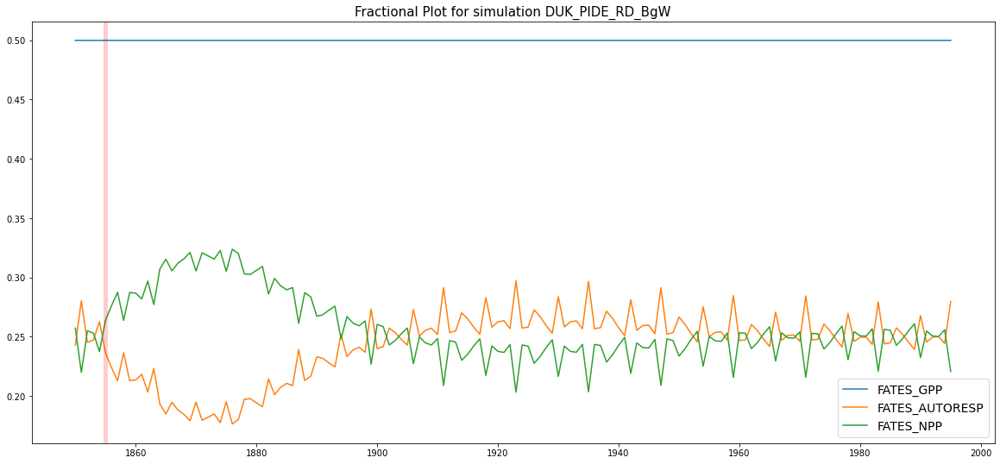

In [740]:
print ("\nFigure Set 2 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_GPP
FATES_AUTORESP
FATES_NPP
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)

    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
        

### *Figure Set 3*


Figure Set 3 >>>>>>


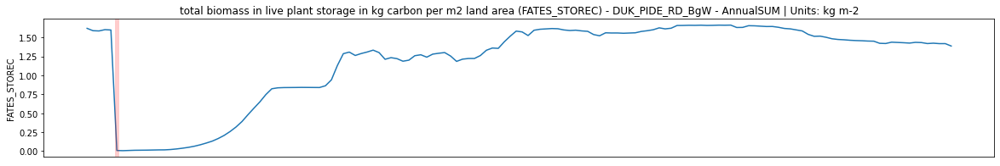

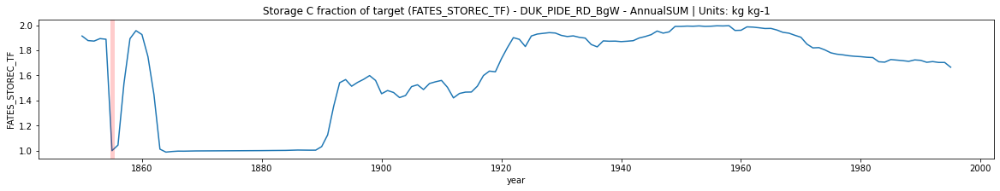

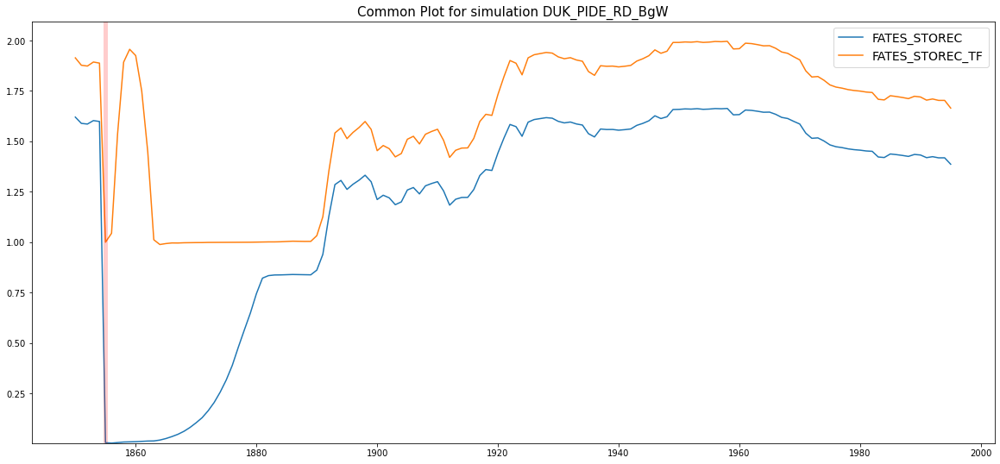

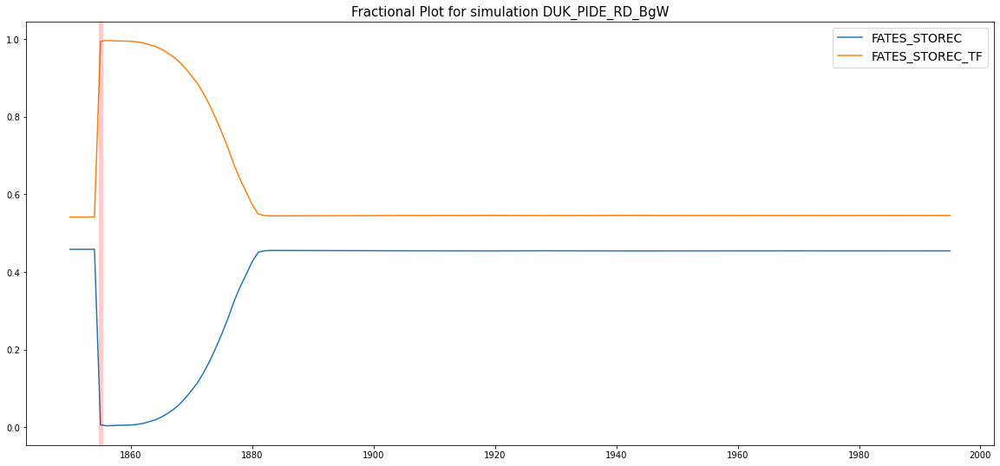

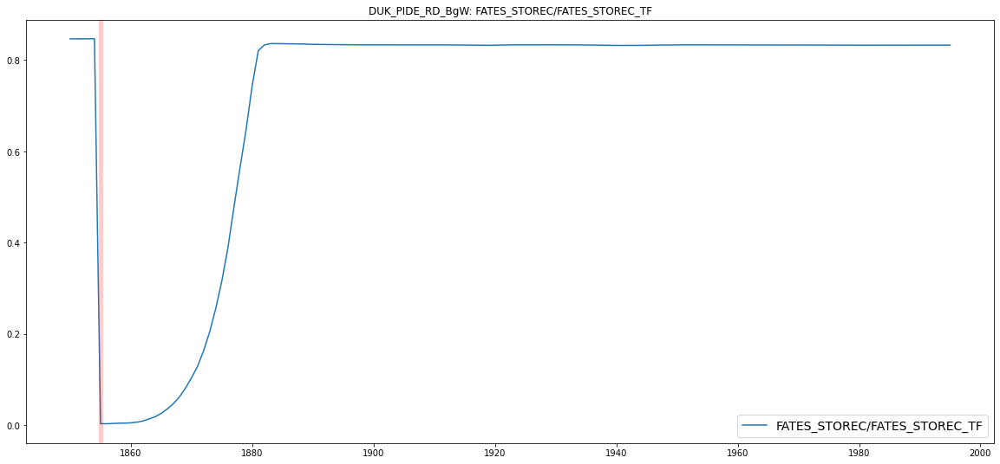

In [741]:
print ("\nFigure Set 3 >>>>>>")
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_STOREC
FATES_STOREC_TF
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREC_TF"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_STOREC/FATES_STOREC_TF")
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_STOREC/FATES_STOREC_TF")
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
        

### *Figure Set 4*


Figure Set 4 >>>>>>


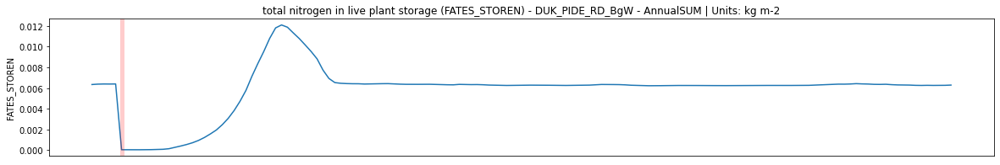

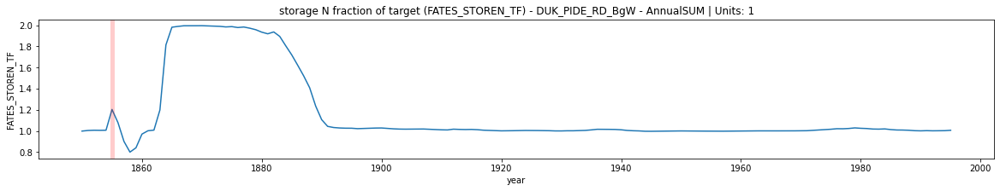

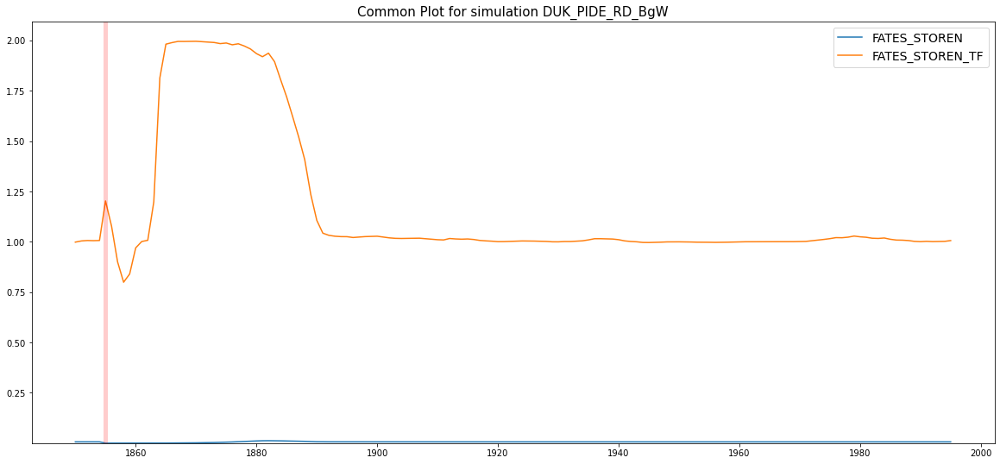

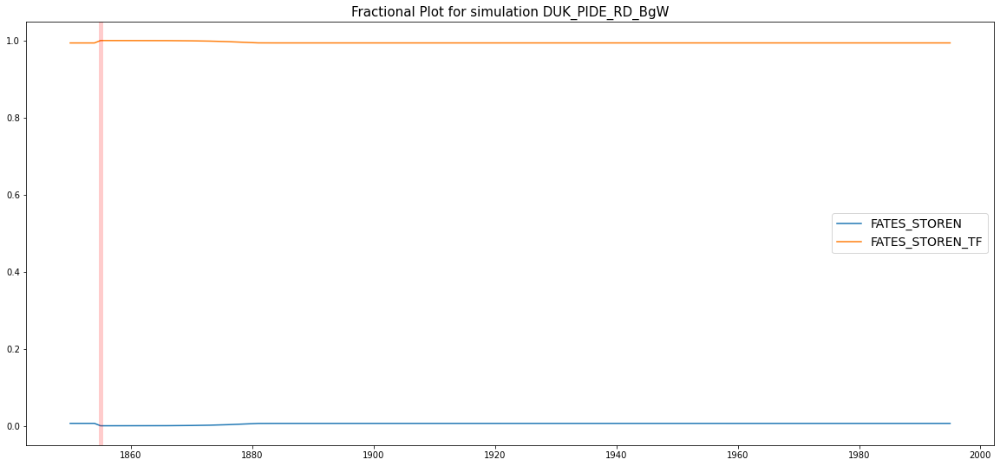

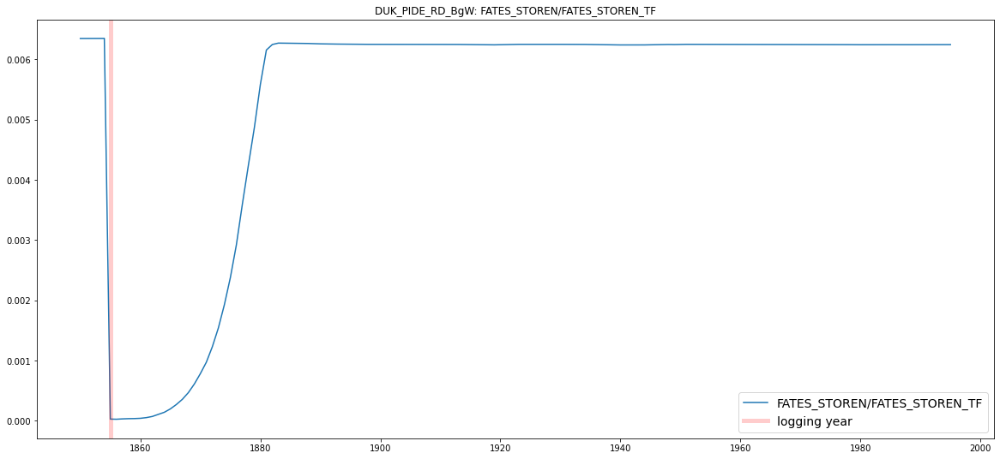

In [742]:
print ("\nFigure Set 4 >>>>>>")
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_STOREN
FATES_STOREN_TF
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_STOREN"]/ds[key]["FATES_STOREN_TF"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_STOREN/FATES_STOREN_TF")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_STOREN/FATES_STOREN_TF")
    
        

### *Figure Set 5*


Figure Set 5 >>>>>>


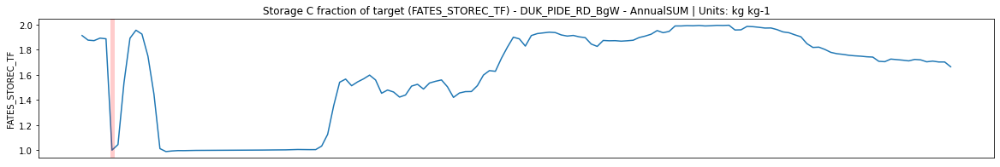

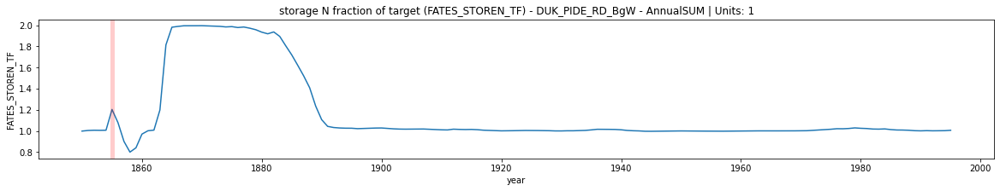

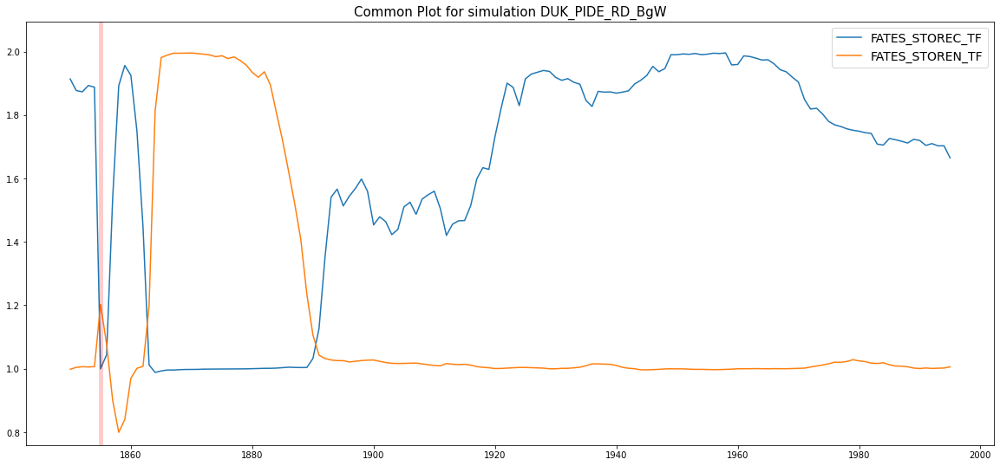

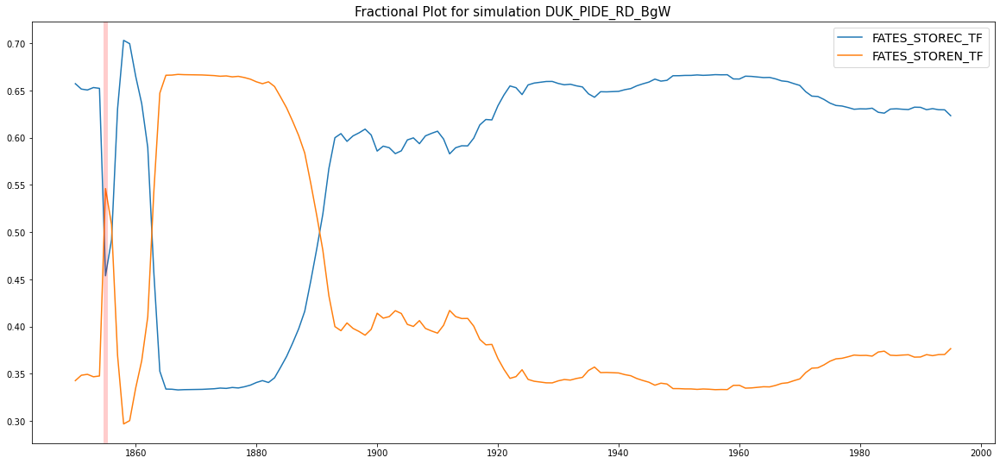

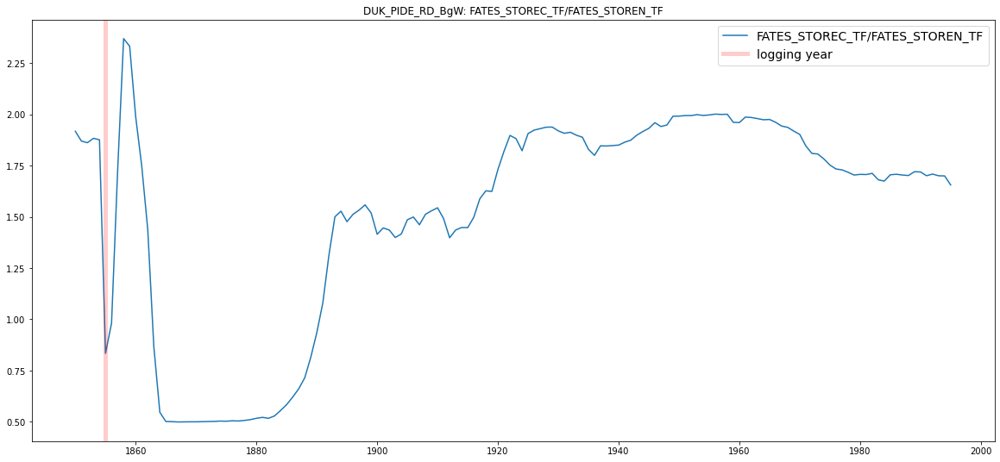

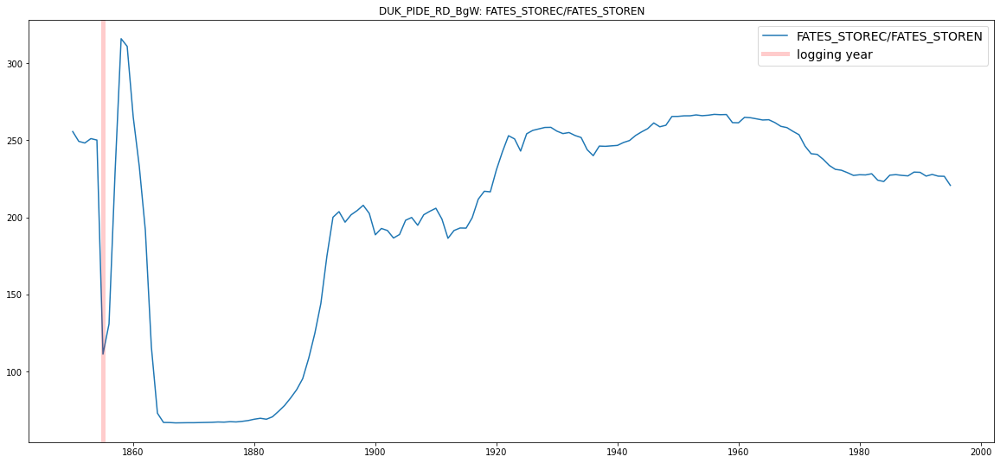

In [743]:
print ("\nFigure Set 5 >>>>>>")
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREN_TF
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_STOREC_TF/FATES_STOREN_TF")
    
fig3 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_STOREC/FATES_STOREN")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_STOREC/FATES_STOREN")
    
        

### *Figure Set 6*


Figure Set 6 >>>>>>


/Users/ud4/opt/anaconda3/envs/pyces/lib/python3.9/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


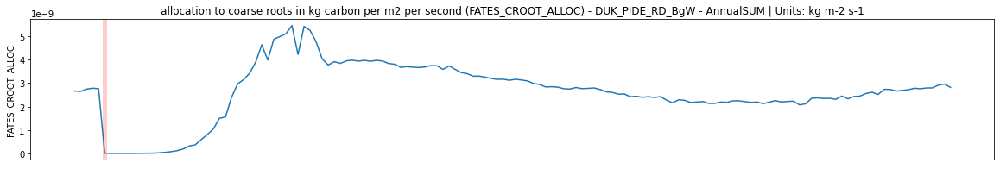

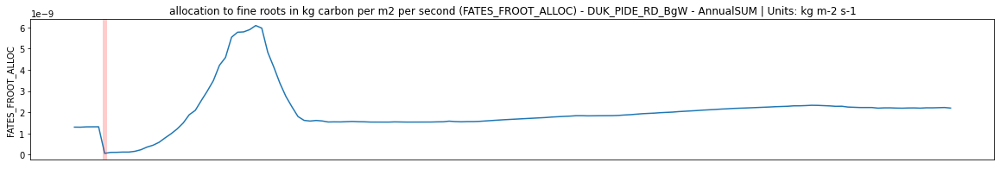

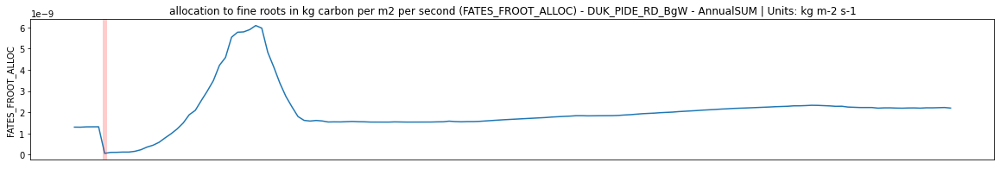

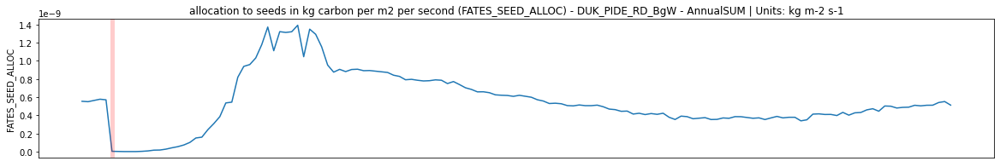

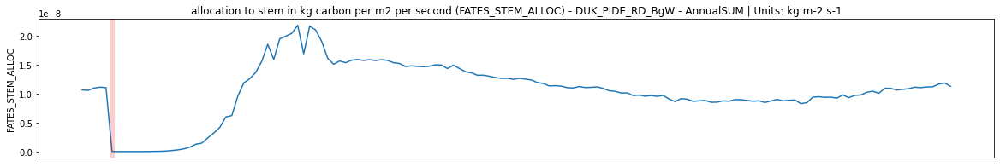

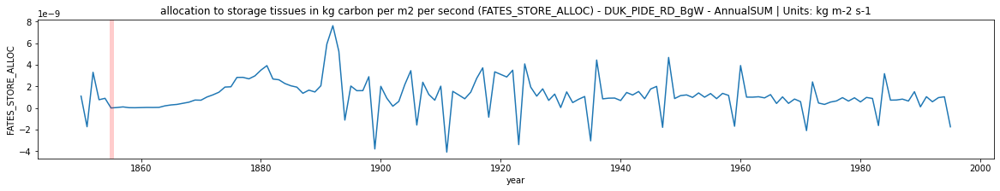

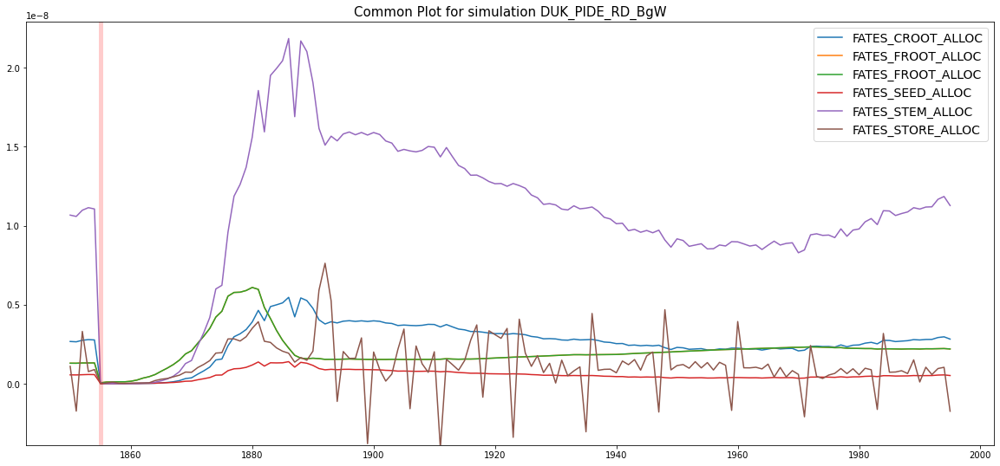

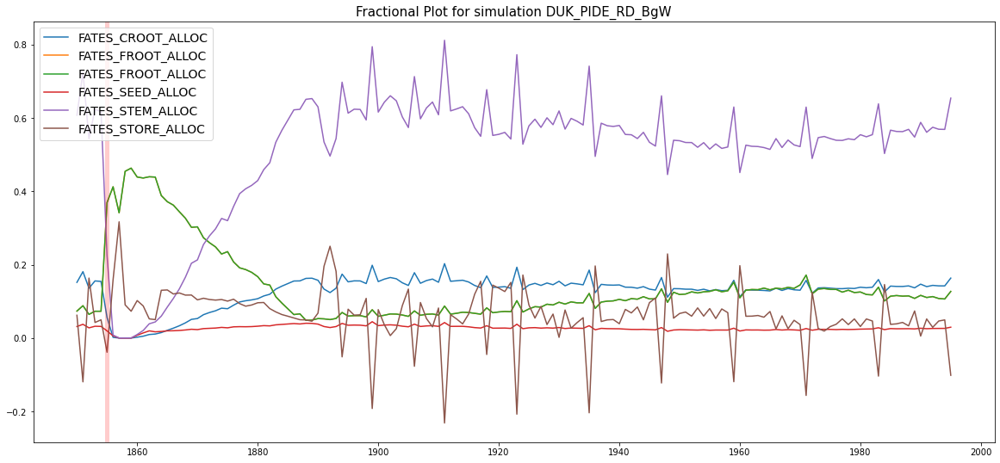

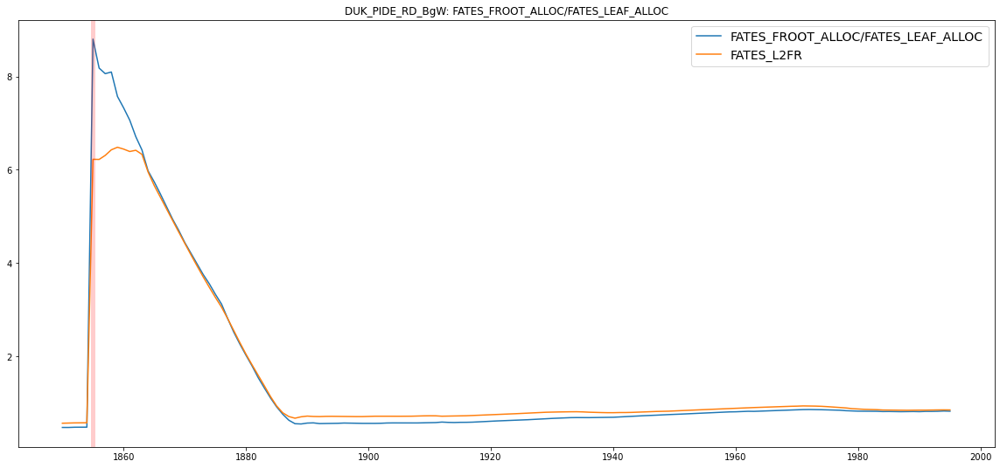

In [744]:
print ("\nFigure Set 6 >>>>>>")
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

'''
vars_plot = [
"FATES_CROOT_ALLOC",
"FATES_FROOT_ALLOC",
"FATES_FROOT_ALLOC",
"FATES_SEED_ALLOC",
"FATES_STEM_ALLOC",
"FATES_STORE_ALLOC"
]

'''

vars_plot = (
"""
FATES_CROOT_ALLOC
FATES_FROOT_ALLOC
FATES_FROOT_ALLOC
FATES_SEED_ALLOC
FATES_STEM_ALLOC
FATES_STORE_ALLOC
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)


fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
    ts_data = ds[key]["FATES_L2FR"].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_L2FR")
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
   

### *Figure Set 7*


Figure Set 7 >>>>>>


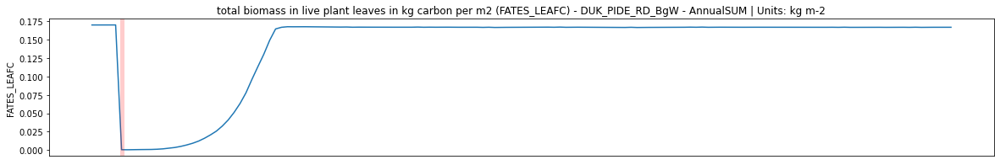

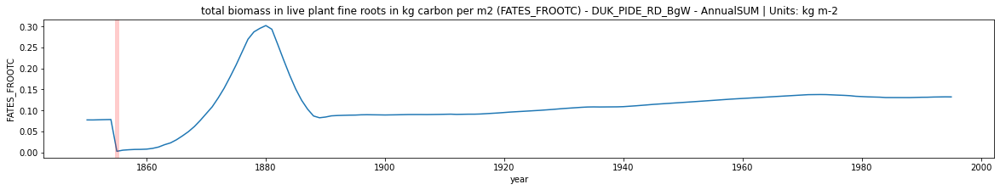

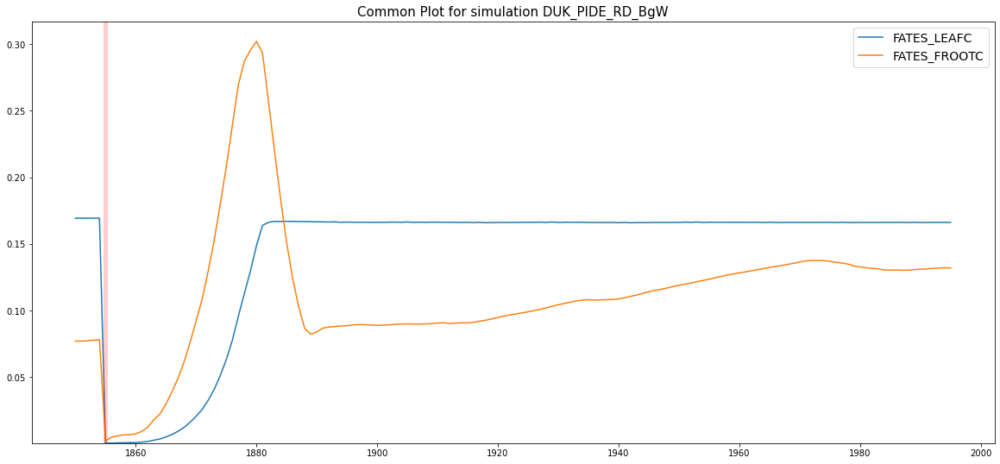

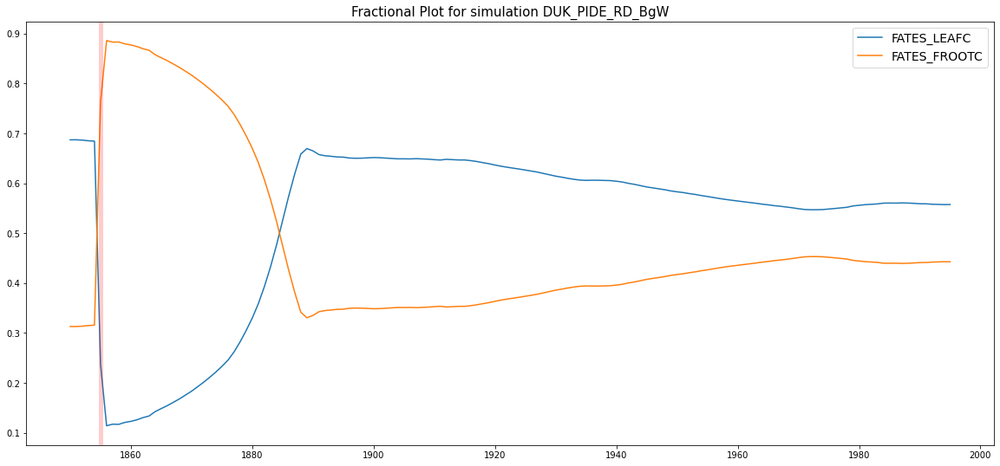

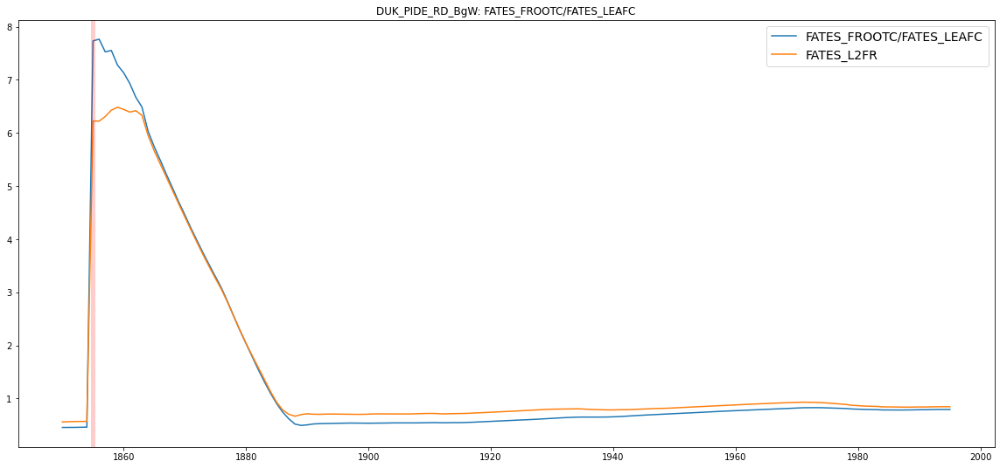

In [745]:
print ("\nFigure Set 7 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_FROOTC/FATES_LEAFC")
    ts_data = ds[key]["FATES_L2FR"].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_L2FR")
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_FROOTC/FATES_LEAFC")
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
        

### *Figure Set 8*


Figure Set 8 >>>>>>


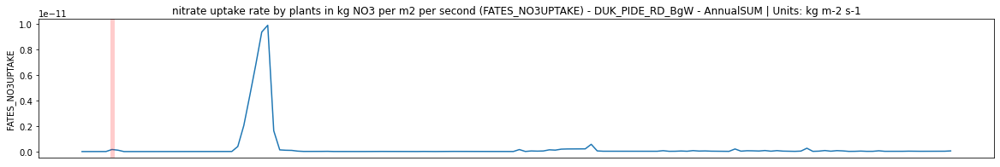

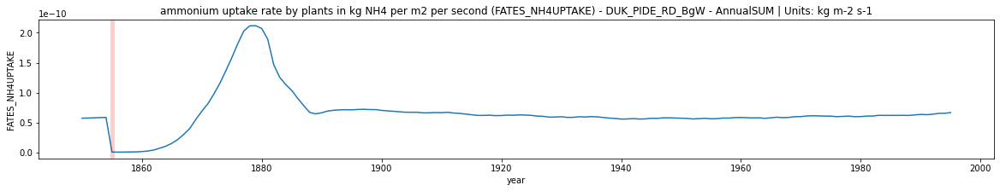

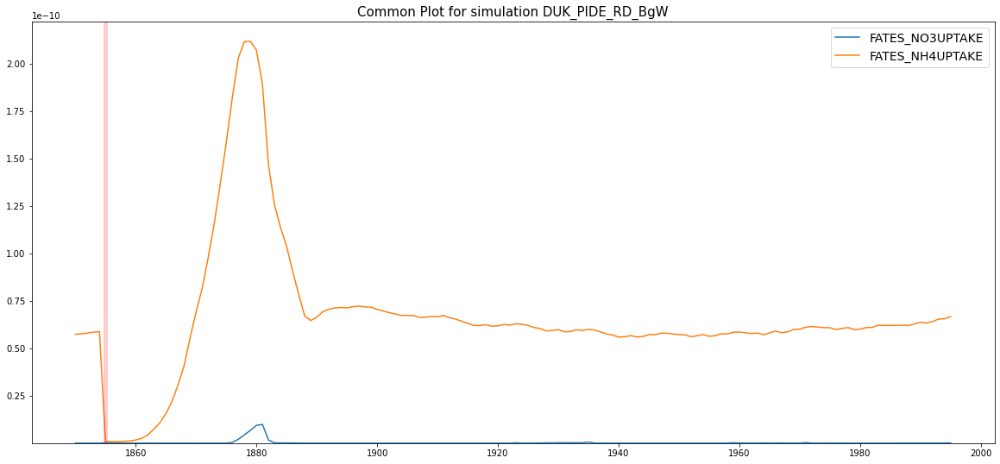

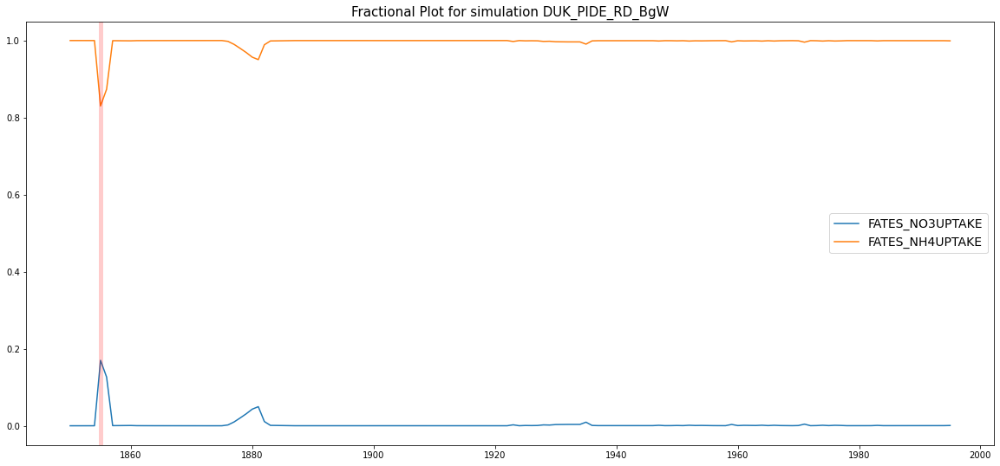

In [746]:
print ("\nFigure Set 8 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
       
        

In [747]:
### *Figure Set 9*


Figure Set 9 >>>>>>


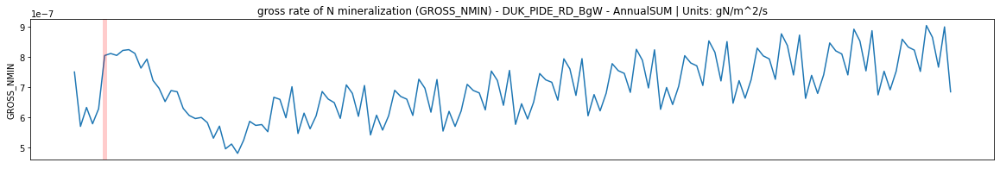

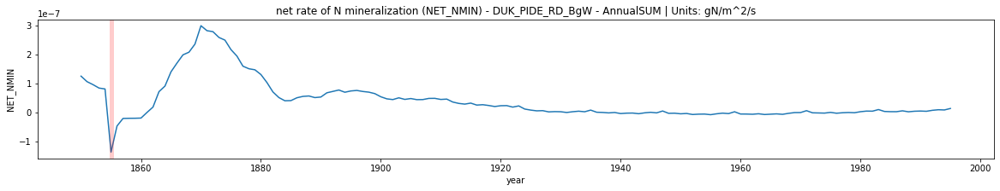

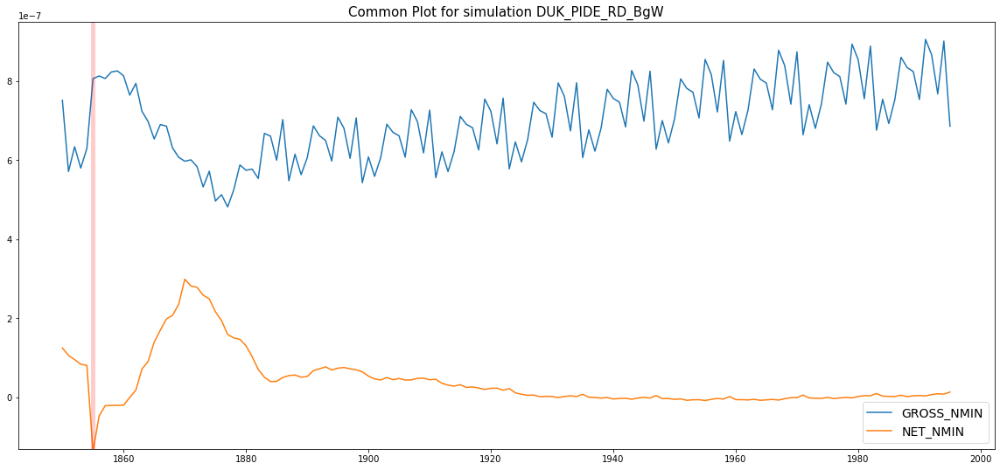

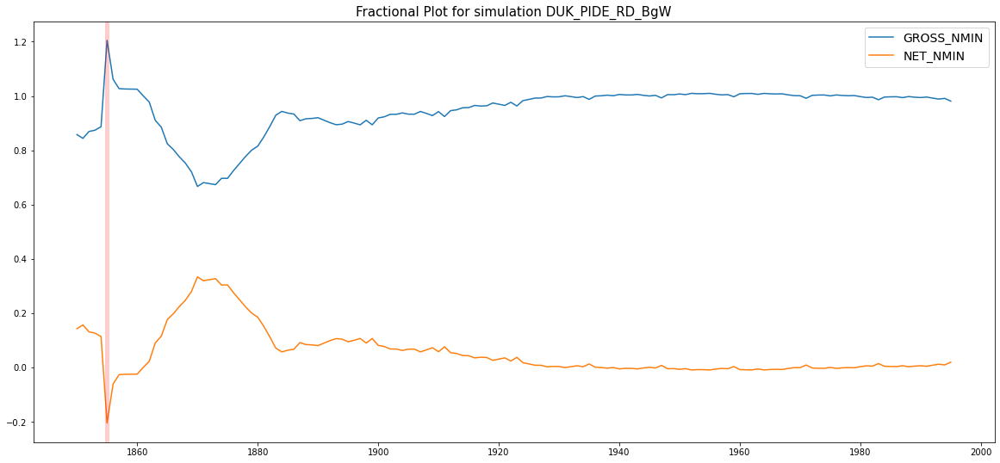

In [748]:
print ("\nFigure Set 9 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
       
        

## *Figure Set 10*


Figure Set 10 >>>>>>


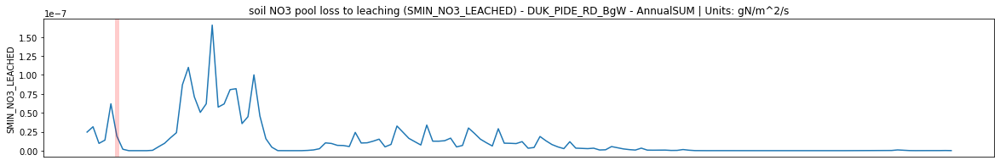

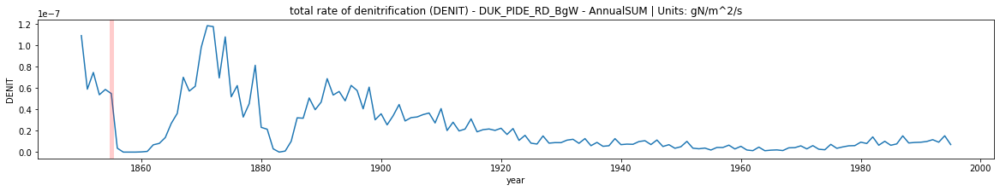

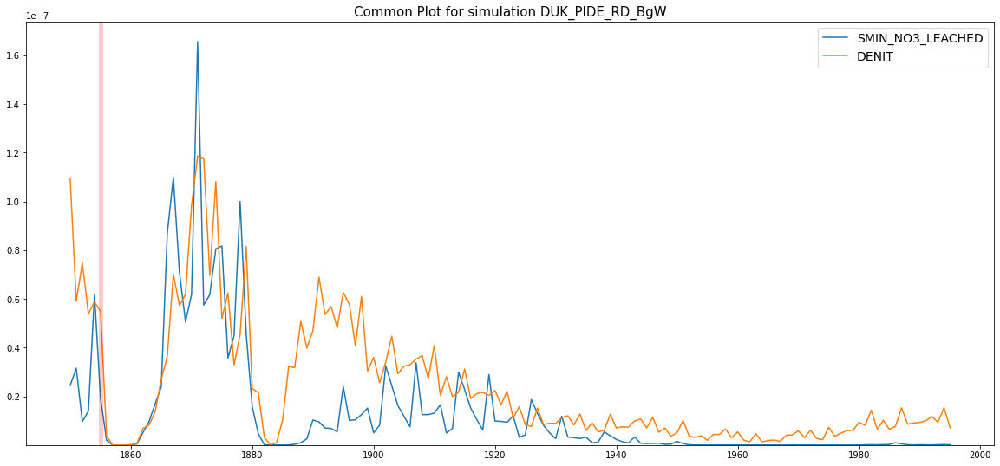

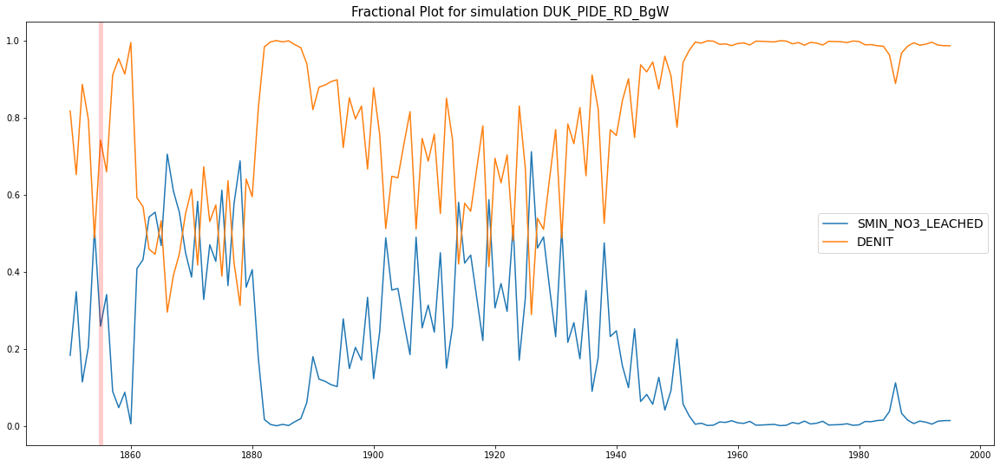

In [749]:
print ("\nFigure Set 10 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
       
        

FATES_FROOTC
FATES_LEAFC
FATES_NONSTRUCTC
FATES_REPROC
FATES_SAPWOODC
FATES_STOREC
FATES_STRUCTC
FATES_VEGC


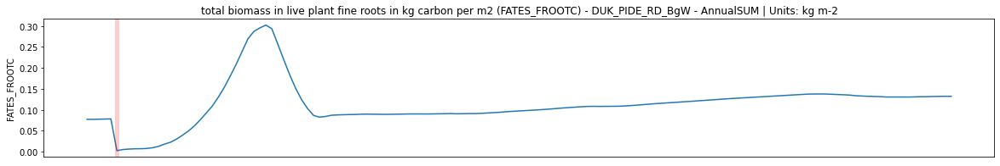

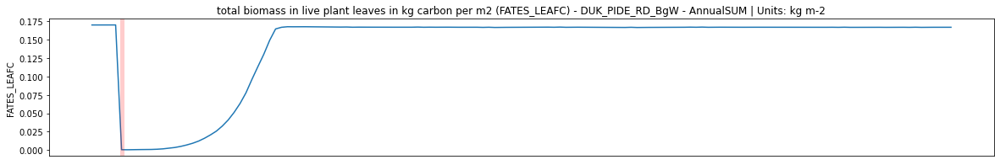

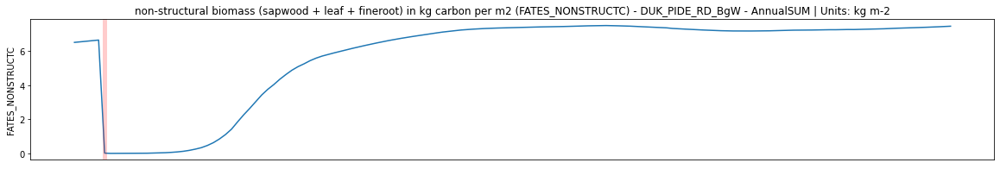

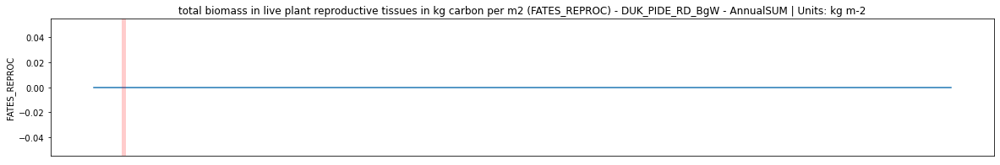

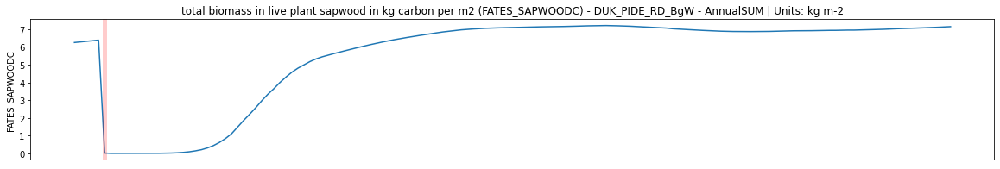

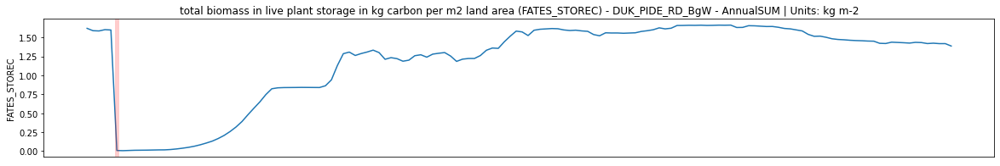

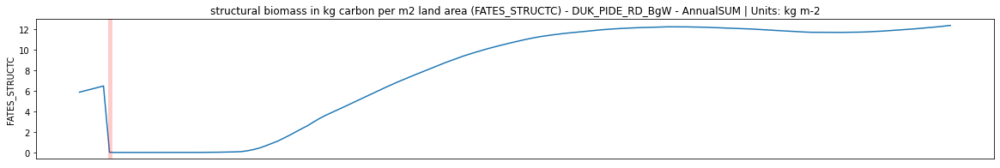

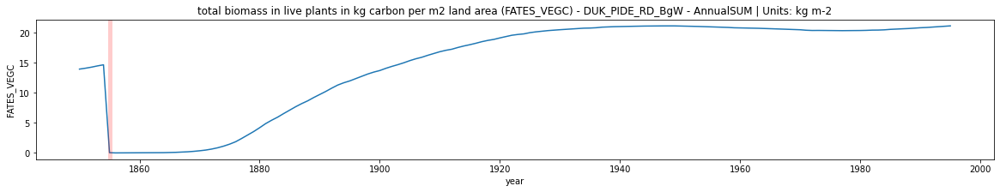

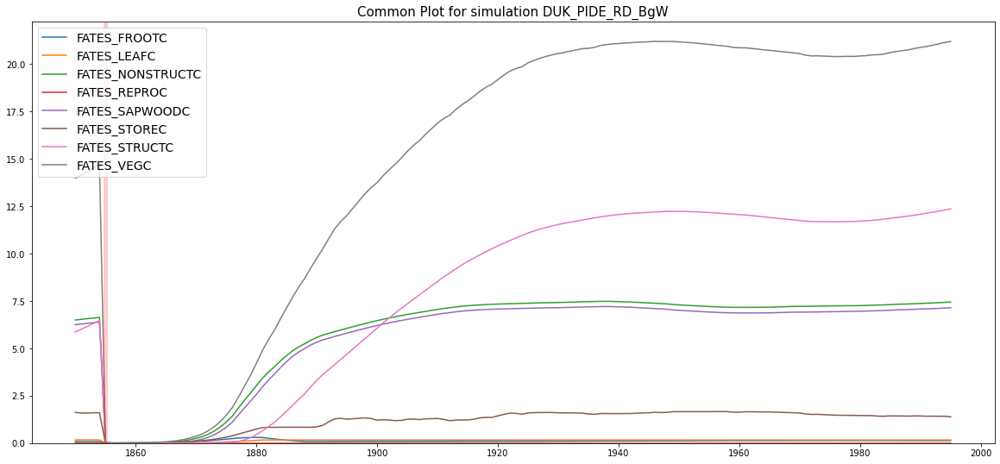

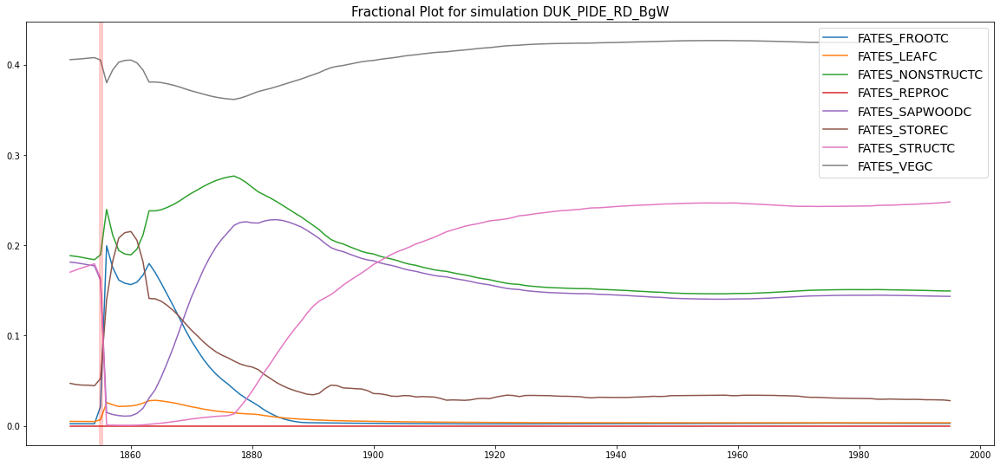

In [750]:
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_FROOTC
FATES_LEAFC
FATES_NONSTRUCTC
FATES_REPROC
FATES_SAPWOODC
FATES_STOREC
FATES_STRUCTC
FATES_VEGC
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    print(var)
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
        

In [751]:
Subplot 1: FATES_NPP (for C-only at that site and RD/ECA) 
Subplot 1: FATES_NPP
Subplot 2: FATES_STOREC
Subplot 2: FATES_STOREC_TF
Subplot 3: FATES_STOREN
Subplot 3: FATES_STOREN_TF
Subplot 4: FATES_STOREC_TF / FATES_STOREN_TF
Subplot 5: FATES_FROOTC_ALLOC / FATES_LEAFC_ALLOC
Subplot 5: FATES_L2FR
Subplot 6: FATES_FROOTC / FATES_LEAFC
Subplot 6: FATES_FROOTC
Subplot 6: FATES_LEAFC
Subplot 7: FATES_NO3UPTAKE
Subplot 7: FATES_NH4UPTAKE 
Subplot 8: NET_NMIN
Subplot 8: GROSS_NMIN
Subplot 9: SMIN_NO3_LEACHED
Subplot 9: DENIT

SyntaxError: invalid syntax (3936198710.py, line 1)

In [ ]:
print ("\nAll Plots >>>>>>")
# For multiple variables on a same plot
fig, axs = plt.subplots(9,1 , figsize=(15,30), dpi=400)

# Subplot 1 >>>
idx_ax = 0
var = "FATES_NPP"
# C-only
sim_conly = sims.replace("RD", "Conly")
key=sim_conly
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var + " C-only")
# RD
key=sims
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var )
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key}\n",fontsize=16)

# Subplot 1 <<<

# Subplot 2 >>>
idx_ax = 1
vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 2 <<<

# Subplot 3 >>>
idx_ax = 2
vars_plot = (
"""
FATES_STOREN_TF
FATES_STOREN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.legend(loc = 5)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 3 <<<

# Subplot 4 >>>
idx_ax = 3
ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"]).groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"]).groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data, 'k+', label = "FATES_STOREC/FATES_STOREN")
ax_tmp.legend(loc = 5)
# Subplot 4 <<<

# Subplot 5 >>>
idx_ax = 4
ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"]).groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
ts_data = ds[key]["FATES_L2FR"].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_L2FR")
# Subplot 5 <<<

# Subplot 6 >>>
idx_ax = 5
vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"]).groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data, 'k+', label = "FATES_FROOTC/FATES_LEAFC")
ax_tmp.legend(loc = 1)

# Subplot 6 <<<

# Subplot 7 >>>
idx_ax = 6
vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.legend(loc = 5)
# Subplot 7 <<<

# Subplot 8 >>>
idx_ax = 7
vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 8 <<<

# Subplot 9 >>>
idx_ax = 8
vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 9 <<<


for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = logging_year, color = 'r',lw=5, alpha=.2)
    
fig.savefig('./Plots/' + f'{key}.pdf',bbox_inches='tight')
fig.savefig('./Plots/' + f'{key}.png',bbox_inches='tight')


In [ ]:
pwd

In [ ]:
print ("Successful run")

# Ignore the plots after this cell!